In [1]:
import warnings
from helper import *
import tensorflow as tf
from math import ceil
from tqdm import tqdm

In [2]:
# basic configuration
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)
pd.set_option('display.max_columns', 500)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
configure_matplotlib(transparent=False)

In [3]:
formatted_df = pd.read_csv('pipe_dataset.csv', index_col=0)
formatted_df.index = pd.to_datetime(formatted_df.index)
formatted_df.head()

,8705902546,8716113919,8718640762,8718640763,8718640787,8718645319,8718647378,8718649158,8718649167,8718649588,8718649589,8718651804,8718653366,8718654166,8718696020,8718696337,8718698387,8718699250,8719905826,8750306523
2021-09-26,102.0,102.0,2192.0,2168.0,2168.0,2352.0,2376.0,5547.0,5547.0,5371.0,3481.0,102.0,102.0,2376.0,102.0,102.0,102.0,102.0,2956.0,102.0
2021-10-03,2130.0,2130.0,2357.0,3253.0,3253.0,484.0,484.0,4800.0,4800.0,4800.0,2538.0,2130.0,2130.0,484.0,2130.0,2130.0,2130.0,2130.0,2064.0,2130.0
2021-10-10,1398.0,1758.0,4918.0,4842.0,4842.0,3196.0,3236.0,3426.0,3426.0,3426.0,2034.0,1758.0,1398.0,3236.0,1758.0,1758.0,1758.0,1758.0,3205.0,1758.0
2021-10-17,600.0,654.0,2897.0,2537.0,2537.0,4774.0,4782.0,7874.0,7874.0,7874.0,1902.0,654.0,600.0,4782.0,654.0,654.0,654.0,654.0,1444.0,654.0
2021-10-24,2190.0,2748.0,860.0,1308.0,1308.0,5556.0,5556.0,7025.0,7025.0,7025.0,3791.0,2748.0,2190.0,5556.0,2748.0,2748.0,2748.0,2748.0,2154.0,2748.0


  0%|                                                  | 0/20 [00:00<?, ?it/s]2023-05-10 12:52:54.974117: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-05-10 12:52:54.974272: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2023-05-10 12:52:55.185371: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-05-10 12:52:55.553902: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:52:56.218481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:01.133446: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
  5%|██▌                                               | 1/20 [00:06<02:00,  6.33s/it]

Epoch 00057: early stopping
Pipe TTNr: 8705902546
Stopped epoch: 56
RMSE: 139.93



2023-05-10 12:53:01.715680: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:02.208227: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:07.142808: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 10%|█████                                             | 2/20 [00:12<01:50,  6.14s/it]

Epoch 00057: early stopping
Pipe TTNr: 8716113919
Stopped epoch: 56
RMSE: 135.64



2023-05-10 12:53:07.713618: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:08.225338: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:13.278887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 15%|███████▌                                          | 3/20 [00:18<01:44,  6.14s/it]

Epoch 00059: early stopping
Pipe TTNr: 8718640762
Stopped epoch: 58
RMSE: 206.82



2023-05-10 12:53:13.925441: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:14.419655: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:19.454037: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 20%|██████████                                        | 4/20 [00:24<01:38,  6.16s/it]

Epoch 00059: early stopping
Pipe TTNr: 8718640763
Stopped epoch: 58
RMSE: 150.02



2023-05-10 12:53:20.101156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:20.631464: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:25.719853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 25%|████████████▌                                     | 5/20 [00:30<01:32,  6.19s/it]

Epoch 00059: early stopping
Pipe TTNr: 8718640787
Stopped epoch: 58
RMSE: 150.02



2023-05-10 12:53:26.294967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:26.810120: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:31.700155: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 30%|███████████████                                   | 6/20 [00:36<01:25,  6.12s/it]

Epoch 00056: early stopping
Pipe TTNr: 8718645319
Stopped epoch: 55
RMSE: 99.20



2023-05-10 12:53:32.263669: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:32.778738: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:37.470177: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 35%|█████████████████▌                                | 7/20 [00:42<01:18,  6.01s/it]

Epoch 00056: early stopping
Pipe TTNr: 8718647378
Stopped epoch: 55
RMSE: 98.36



2023-05-10 12:53:38.048697: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:38.555758: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:44.206953: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 40%|████████████████████                              | 8/20 [00:49<01:14,  6.24s/it]

Epoch 00065: early stopping
Pipe TTNr: 8718649158
Stopped epoch: 64
RMSE: 380.98



2023-05-10 12:53:44.870689: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:45.397757: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:51.071753: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 45%|██████████████████████▌                           | 9/20 [00:56<01:10,  6.43s/it]

Epoch 00065: early stopping
Pipe TTNr: 8718649167
Stopped epoch: 64
RMSE: 380.98



2023-05-10 12:53:51.648993: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:52.180039: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:57.736969: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 50%|█████████████████████████                         | 10/20 [01:02<01:05,  6.50s/it]

Epoch 00065: early stopping
Pipe TTNr: 8718649588
Stopped epoch: 64
RMSE: 385.73



2023-05-10 12:53:58.292819: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:53:58.836389: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:03.381023: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 55%|███████████████████████████▌                      | 11/20 [01:08<00:56,  6.24s/it]

Epoch 00055: early stopping
Pipe TTNr: 8718649589
Stopped epoch: 54
RMSE: 119.62



2023-05-10 12:54:03.933629: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:04.441732: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:09.219392: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 60%|██████████████████████████████                    | 12/20 [01:14<00:48,  6.12s/it]

Epoch 00057: early stopping
Pipe TTNr: 8718651804
Stopped epoch: 56
RMSE: 136.58



2023-05-10 12:54:09.777359: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:10.283696: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:14.967430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 65%|████████████████████████████████▌                 | 13/20 [01:20<00:42,  6.01s/it]

Epoch 00057: early stopping
Pipe TTNr: 8718653366
Stopped epoch: 56
RMSE: 140.90



2023-05-10 12:54:15.536931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:16.048561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:20.600340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 70%|███████████████████████████████████               | 14/20 [01:25<00:35,  5.90s/it]

Epoch 00056: early stopping
Pipe TTNr: 8718654166
Stopped epoch: 55
RMSE: 98.36



2023-05-10 12:54:21.167562: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:21.676439: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Epoch 00057: early stopping
Pipe TTNr: 8718696020
Stopped epoch: 56
RMSE: 136.58



2023-05-10 12:54:26.365203: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 75%|█████████████████████████████████████▌            | 15/20 [01:31<00:29,  5.89s/it]2023-05-10 12:54:27.046674: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:27.568862: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:32.421325: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 80%|████████████████████████████████████████          | 16/20 [01:37<00:23,  5.91s/it]

Epoch 00057: early stopping
Pipe TTNr: 8718696337
Stopped epoch: 56
RMSE: 136.58



2023-05-10 12:54:33.001722: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:33.590260: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:38.545193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 85%|██████████████████████████████████████████▌       | 17/20 [01:43<00:17,  5.97s/it]

Epoch 00057: early stopping
Pipe TTNr: 8718698387
Stopped epoch: 56
RMSE: 136.58



2023-05-10 12:54:39.126946: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:39.711013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:44.829890: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 90%|█████████████████████████████████████████████     | 18/20 [01:50<00:12,  6.06s/it]

Epoch 00057: early stopping
Pipe TTNr: 8718699250
Stopped epoch: 56
RMSE: 136.58



2023-05-10 12:54:45.387322: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:45.974372: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:50.527981: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
 95%|███████████████████████████████████████████████▌  | 19/20 [01:55<00:05,  5.96s/it]

Epoch 00055: early stopping
Pipe TTNr: 8719905826
Stopped epoch: 54
RMSE: 31.44



2023-05-10 12:54:51.116813: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:51.750887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-05-10 12:54:56.842694: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
100%|██████████████████████████████████████████████████| 20/20 [02:02<00:00,  6.10s/it]

Epoch 00057: early stopping
Pipe TTNr: 8750306523
Stopped epoch: 56
RMSE: 133.08



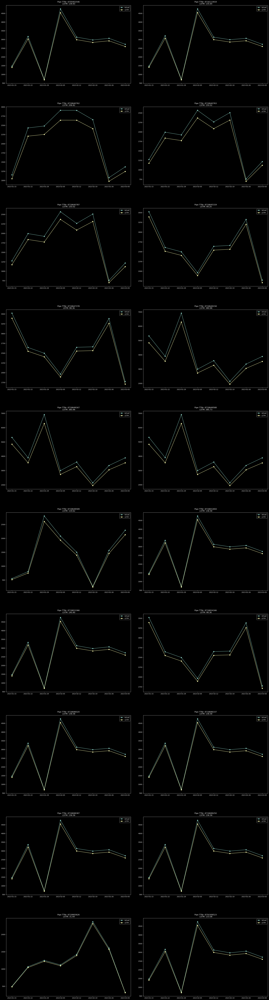

In [4]:
range_index = (0, 20)
rmse_list, pipe_numbers = [], []
predictions, actual = [], []
loss, models = {}, {}

for i in tqdm(range(*range_index), ncols=100, bar_format="{l_bar}{bar:50}{r_bar}"):
    # format the train and test data to be used in the model
    formatted_df = format_time_series_df(master_df=formatted_df, selected_years=[2021, 2022, 2023])
    pipe_number, train, test = select_pipe_and_split_data(data=formatted_df,
                                                          pipe_index=i,
                                                          is_sklearn=True,
                                                          test_size=0.1)

    pipe_numbers.append(pipe_number)
    actual.append(test)

    # convert index to datetime
    test.index = test.index.strftime('%Y-%m-%d')

    # compare LSTM with actual values
    ax = plt.subplot(ceil(range_index[1] / 2), 2, i + 1)

    ax.figure.set_size_inches(30, i * 6)

    # # plot the actual values
    ax.set_title(f"Pipe TTNr: {pipe_number}")
    ax.plot(test, marker='o')

    ax.set_xticks(range(len(test.index)), test.index)

    # create and run the LSTM model
    prediction, lstm_rmse, lstm_test, train_loss, val_loss, model, stopped_epoch = create_lstm_model(
        train=train,
        test=test,
        activation='relu',
        epoch=100,
        unit=(len(formatted_df.index), 10),
        learning_rate=0.001,
        min_learning_rate=0.0001,
        factor=0.2,
        patience=5,
        reduce=False,
        optimizer="adam")

    print(f"Pipe TTNr: {pipe_number}\nStopped epoch: {stopped_epoch}\nRMSE: {lstm_rmse:.2f}\n")
    
    # print(f"Pipe TTNr: {pipe_number}\nTotal epochs run: {len(train_loss)}\nRMSE: {lstm_rmse:.2f}\n")

    models[pipe_number] = model
    
    # store the loss values for every pipe
    loss[pipe_number] = {"train_loss": train_loss,
                         "val_loss": val_loss}

    rmse_list.append(lstm_rmse)
    predictions.append(prediction)

    # plot predictions
    ax.set_title(f"Pipe TTNr: {pipe_number}\n LSTM: {lstm_rmse:.2f}")
    ax.plot(prediction, marker='o')
    ax.set_xticks(range(len(test.index)), test.index)
    ax.legend(["Actual", "LSTM"], loc="upper right")

    # add vertical spacing between the subplots
    plt.subplots_adjust(hspace=0.3, wspace=0.1)

plt.show()

In [6]:
configure_matplotlib(transparent=False)
# plot the train_loss and val_loss for every pipe
for i in range(*range_index):
    ax = plt.subplot(ceil(range_index[1] / 2), 2, i + 1)
    ax.figure.set_size_inches(30, i * 6)
    ax.plot(loss[pipe_numbers[i]]["train_loss"])
    ax.plot(loss[pipe_numbers[i]]["val_loss"])
    ax.set_title(f"Pipe TTNr: {pipe_numbers[i]}")
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.legend(["train", "validation"], loc="upper right")
    plt.subplots_adjust(hspace=0.3, wspace=0.1)

plt.show()

In [6]:
pipe_indexes = []
for i in range(len(actual)):
    pipe_indexes.append(actual[i].name)

top_20_df = pd.DataFrame(index=pd.MultiIndex(levels=[[], []], codes=[[], []]), columns=[])
top_20_df.index = pd.MultiIndex.from_product([pipe_numbers, actual[0].index], names=['Pipe TTNr', 'Date'])

In [7]:
top_20_df['Actual'] = np.concatenate(actual)
top_20_df['Prediction'] = np.concatenate(predictions)

In [8]:
top_20_df.index.levels[1]

Index(['2023-01-15', '2023-01-22', '2023-01-29', '2023-02-05', '2023-02-12',
       '2023-02-19', '2023-02-26', '2023-03-05'],
      dtype='object', name='Date')

In [9]:
top_20_df.head()

Actual   Prediction
Pipe TTNr  Date                           
8705902546 2023-01-15  1470.0  1401.261963
           2023-01-22  3174.0  3024.710938
           2023-01-29   720.0   686.654114
           2023-02-05  4752.0  4528.115723
           2023-02-12  3134.0  2986.601807

In [10]:
def get_top_20(selected_date: str, df: pd.DataFrame = top_20_df, lstm_only: bool = True) -> pd.DataFrame:
    if selected_date not in df.index.levels[1]:
        raise ValueError(f"Date {selected_date} is not in the index")
    else:
        selected_df = df.copy().loc[(slice(None), selected_date), :]
        selected_df = selected_df.copy().sort_values(by='Prediction', ascending=False, inplace=False)
        if lstm_only:
            lstm_only_df = selected_df.copy().loc[:, ['Prediction']]
            lstm_only_df.index = lstm_only_df.index.droplevel(1)
            lstm_only_df['Pipe TTNr'] = lstm_only_df.index
            lstm_only_df.index = range(1, len(lstm_only_df) + 1)
            lstm_only_df = lstm_only_df.copy().loc[:, ['Pipe TTNr', 'Prediction']]
            lstm_only_df.index.name = selected_date
            return lstm_only_df
        else:
            selected_df = selected_df.copy().loc[:, ['Actual', 'Prediction']]
            selected_df.index = selected_df.index.droplevel(1)
            selected_df['Pipe TTNr'] = selected_df.index
            selected_df.index = range(1, len(selected_df) + 1)
            selected_df = selected_df.copy().loc[:, ['Pipe TTNr', 'Actual', 'Prediction']]
            selected_df.index.name = selected_date
            return selected_df

In [11]:
predicted_df = get_top_20('2023-03-05', lstm_only=False)
predicted_df

,Pipe TTNr,Actual,Prediction
2023-03-05,,,
1,8718649158,3883.0,3534.268066
2,8718649167,3883.0,3534.268066
3,8718649588,3883.0,3529.916748
4,8750306523,2724.0,2602.260986
5,8716113919,2724.0,2600.215088
6,8718699250,2724.0,2600.214111
7,8718698387,2724.0,2600.214111
8,8718696337,2724.0,2600.214111
9,8718696020,2724.0,2600.214111


In [12]:
def forecast_future_weeks(df: pd.DataFrame,
                          forecast_pipe_index: int = 1,
                          num_prediction: int = 1,
                          look_back: int = 7):
    
    forecast_pipe_index = forecast_pipe_index
    forecasted_pipe = pipe_numbers[forecast_pipe_index]
    num_prediction = num_prediction

    # get the last 7 weeks of the pipe
    last_7_days = df.loc[:, forecasted_pipe].iloc[-look_back:]

    # convert the last 7 weeks to a numpy array
    last_7_days = np.array(last_7_days)

    # reshape the array to be used in the model
    last_7_days = last_7_days.reshape((1, last_7_days.shape[0], 1))

    # # forecast the next 7 days
    forecast = models[forecasted_pipe].predict(last_7_days, use_multiprocessing=True)

    # convert the forecasted values to a dataframe
    forecast_df = pd.DataFrame(forecast)
    forecast_df.index = pd.date_range(start=df.index[-1] + timedelta(days=1), periods=num_prediction, freq='W')
    forecast_df.columns = [forecasted_pipe]

    return forecast_df

In [13]:
cnt = 0

# convert formatted_df index from period to datetime
test_df = formatted_df.copy()
test_df.index = test_df.index.to_timestamp(how="S", freq="W")

In [24]:
added_df = pd.DataFrame()

for i in range(len(pipe_numbers)):
    if pipe_numbers[i] in ["8718649588", "8718649167", "8718649158"]:
        added_df = pd.concat([added_df, forecast_future_weeks(forecast_pipe_index=i, num_prediction=1, df=test_df, look_back=7 + cnt * 5)], axis=1)
    else:
        added_df = pd.concat([added_df, forecast_future_weeks(forecast_pipe_index=i, num_prediction=1, df=test_df, look_back=7 + cnt * 5)], axis=1)

1/1 [==============================] - 0s 42ms/step


In [25]:
if added_df.index.values.astype(np.datetime64) not in list(test_df.index.values):
    test_df = pd.concat([test_df, added_df], axis=0, ignore_index=False)
    cnt += 1

In [26]:
test_df = test_df.round(1)
test_df.tail(cnt)

,8705902546,8716113919,8718640762,8718640763,8718640787,8718645319,8718647378,8718649158,8718649167,8718649588,8718649589,8718651804,8718653366,8718654166,8718696020,8718696337,8718698387,8718699250,8719905826,8750306523
2023-03-12,4293.0,4555.5,3160.1,2987.8,2987.8,3764.6,3770.6,3149.0,3149.0,3483.3,3375.4,6079.9,6071.1,3770.6,6079.9,6079.9,6079.9,6079.9,2557.2,4553.3
2023-03-19,5463.0,5371.6,3423.8,5098.7,5098.7,4069.7,4913.6,2823.3,2823.3,2923.5,3367.4,5786.5,5761.9,4913.6,5786.5,5786.5,5786.5,5786.5,4426.5,5376.8
2023-03-26,11074.4,9198.8,6297.6,3812.9,3812.9,6667.7,1432.9,5028.3,5028.3,5033.5,6538.7,10402.2,10383.1,1432.9,10402.2,10402.2,10402.2,10402.2,7999.9,11086.7


In [27]:
configure_matplotlib(transparent=False)
# plot the time-series for the top 20 pipes of test_df 
for i in range(*range_index):
    ax = plt.subplot(ceil(range_index[1] / 2), 2, i + 1)
    ax.figure.set_size_inches(30, i * 6)

    ax.plot(test_df.iloc[:-cnt, i], marker='o')
    ax.plot(test_df.iloc[-cnt:, i], marker='o')
    ax.plot([test_df.index[-cnt - 1], test_df.index[-cnt]], [test_df.iloc[-cnt - 1, i], test_df.iloc[-cnt, i]], marker='o')
    ax.set_title(f"Pipe TTNr: {pipe_numbers[i]} {i}")
    ax.legend(["Actual", "Forecast"], loc="upper right")
    plt.subplots_adjust(hspace=0.3, wspace=0.1)

In [23]:
# plot the time-series for the first column of test_df and added_df
# fig, ax = plt.subplots(figsize=(20, 10))
# ax.plot(test_df.iloc[:-cnt, 0], marker='o')
# ax.plot(test_df.iloc[-cnt:, 0], marker='o')
# ax.plot([test_df.index[-cnt - 1], test_df.index[-cnt]], [test_df.iloc[-cnt - 1, 0], test_df.iloc[-cnt, 0]], marker='o')
# ax.set_title(f"Pipe TTNr: {pipe_numbers[0]}")
# ax.legend(["Actual", "Forecast"], loc="upper right")
# plt.show()

In [ ]:
# save_df = test_df.tail(1).T.sort_values(by=test_df.tail(1).index[0], ascending=False)
# save_df['Pipe TTNr'] = save_df.index
# save_df.index = range(1, len(save_df) + 1)
# save_df.index.name = save_df.columns[0]
# save_df.columns = ['Prediction', 'Pipe TTNr']
# save_df

In [ ]:
# write test_df.tail(1) to excel file
# save_dir = "/Users/ozansahin/Documents/GitHub/Bosch-Data-Analysis/"
# save_df.to_excel(f"{save_dir}forecast_2023_w10.xlsx")